# Machine Learning LAB 3: CLUSTERING - K-means and linkage-based clustering

Course 2023/24: *M. Caligiuri*, *P. Talli*, *F. Lincetto*, *F. Chiariotti*, *P. Zanuttigh*

The notebook contains some simple tasks about **CLUSTERING**.

Complete all the **required code sections** and **answer to all the questions**.

### IMPORTANT for the evaluation score:

1. **Read carefully all cells** and **follow the instructions**.
2. **Re-run all the code from the beginning** to obtain the results for the final version of your notebook, since this is the way we will do it before evaluating your notebooks.
3. Make sure to fill the code in the appropriate places **without modifying the template**, otherwise you risk breaking later cells.
4. Please **submit the jupyter notebook file (.ipynb)**, do not submit python scripts (.py) or plain text files. **Make sure that it runs fine with the restat&run all command**.
5. **Answer the questions in the appropriate cells**, not in the ones where the question is presented.

## Image segmentation with k-means

In this laboratory we will use the k-means algorithm to cluster a dataset of 3D points. We will apply **K-means** to the problem of image compression and image segmentation. The main idea is to apply k-means to the colors of the pixels of an image to select the k most representative colors. Then, we will replace each pixel color with the closest representative color. This will allow us to reduce the number of colors in the image and compress it. A color is a vector of 3 values (R,G,B) that represent the amount of red, green and blue in the color; this implies that each pixel is a point in a 3D space.

In particular you are going to implement the k-means algorithm from scratch and to compare the results with the implementation already present in the sklearn library.

In the second part of the laboratory we will use a **linkage-based** clustering algorithm to cluster a dataset of 2D points and compare it with the results obtained with k-means.

---

## Preliminary step

Place your **name** and **ID number** (matricola) in the cell below. <br>
Also recall to **save the file as Surname_Name_LAB03.ipynb**, failure to do so will incur in a **lower grade**.

**Student name**: Gabriele Bertinelli

**ID Number**: 2103359

---

## Import all the necessary Python libraries

In [1]:
%matplotlib inline  

import numpy as np
import typing as tp
import matplotlib.pyplot as plt
from sklearn import metrics
from sklearn.cluster import KMeans, AgglomerativeClustering
from matplotlib import pyplot as plt

---

## Define the heplper functions

In this section you will find some helper functions (some already implemented, some to be implemented by you) that will be used in the following sections.
1. `img_plot` -> function to plot an image with name and dimension as title,
2. `scatter_plot` -> function to plot a scatter plot of the data,
3. `scatter_plot_2d` -> function to plot a 2D scatter plot of the data,
4. `error_plot` -> function to plot the error of the k-means algorithm over the iterations,
5. `cluster_plot` -> function to plot the obtained clusters.

**DO NOT CHANGE THE PRE-WRITTEN CODE UNLESS OTHERWISE SPECIFIED**

In [2]:
def img_plot(img: np.ndarray, title: str = None) -> None:
    """
    Plot an image
    :param img: image to plot
    :param title: title of the plot
    """
    
    plt.figure()
    plt.imshow(img)
    plt.axis('off')
    if title is not None:
        plt.title(f'{title}: {img.shape}')
    plt.tight_layout()
    plt.show()
    plt.close()

In [3]:
def scatter_plot(data: np.ndarray, clusters: np.ndarray = None, centers: np.ndarray = None, title: str = None) -> None:
    """
    Plot a scatter plot of the data
    :param data: data to plot
    :param clusters: cluster labels
    :param centers: cluster centers
    :param title: title of the plot
    """
    
    fig = plt.figure()
    axis = fig.add_subplot(1, 1, 1, projection="3d")
    axis.set_xlabel("Red")
    axis.set_ylabel("Green")
    axis.set_zlabel("Blue", rotation=90, labelpad=-1)
    if title is not None:
        plt.title(title)
    if clusters is None:
        axis.scatter(data[:,0], data[:,1], data[:,2], marker="o", c=data, s=5)
    else:
        axis.scatter(data[:,0], data[:,1], data[:,2], marker="o", c=clusters, s=1, cmap='viridis', zorder=0, alpha=0.5 )
    if centers is not None:
        axis.scatter(centers[:,0], centers[:,1], centers[:,2], c='red', s=400, zorder=10)
    plt.tight_layout()
    plt.show()
    plt.close()

In [4]:
def scatter_plot_2d(x: np.ndarray, y: np.ndarray = None, centers: np.ndarray = None, title: str = None) -> None:
    """
    Plot a scatter plot of the data
    :param x: data to plot
    :param y: cluster labels
    :param centers: cluster centers
    :param title: title of the plot
    """

    fig = plt.figure()
    plt.scatter(x[:,0], x[:,1], c=y, marker="o", s=10, cmap='viridis')
    plt.scatter(centers[:,0], centers[:,1], c='black', s=200, alpha=0.5)
    if title is not None:
        plt.title(title)
    plt.tight_layout()
    plt.show()
    plt.close()

In [5]:
def error_plot(errors: np.ndarray, labels: np.ndarray = None) -> None:
    """
    Plot the errors over the iterations
    :param errors: errors to plot
    """
    
    if labels is None:
        plt.plot(errors[1:-1])
        plt.plot(errors[1:-1], 'ro')
    else:
        plt.plot(labels, errors)
        plt.plot(labels, errors, 'ro')
    plt.title('Error over iterations')
    plt.ylabel('Error')
    plt.xlabel('Iteration #')
    plt.grid()
    plt.tight_layout()
    plt.show()
    plt.close()

In [6]:
def cluster_plot(labels: np.ndarray, x: np.ndarray, title: str = None) -> None:
    """
    Plot the clusters
    :param labels: cluster labels
    :param x: data
    :param title: title of the plot
    """
    
    # Black removed and is used for noise instead.
    unique_labels = set(labels)
    colors = [plt.cm.Spectral(each)
            for each in np.linspace(0, 1, len(unique_labels))]
    for k, col in zip(unique_labels, colors):
        if k == -1:
            # Black used for noise.
            col = [0, 0, 0, 1]

        class_member_mask = (labels == k)

        xy = x[class_member_mask ]
        plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
                markeredgecolor='k', markersize=14)

        xy = x[class_member_mask ]
        plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
                markeredgecolor='k', markersize=6)

    if title is not None:
        plt.title(title)
    plt.tight_layout()
    plt.show()
    plt.close()

---

## A) K-means clustering

### TO DO (A.0)
    
**Set** the random **seed** using your **ID**. If you need to change it for testing add a constant explicitly, eg.: 1234567 + 1

In [7]:
# Fix your ID ("numero di matricola") and the seed for random generator
# as usual you can try different seeds by adding a constant to the number:
# ID = 1234567 + X
ID = 2103359  # insert your ID number here
np.random.seed(ID)

Load the provided images and display them (if you like you can experiment with other images)

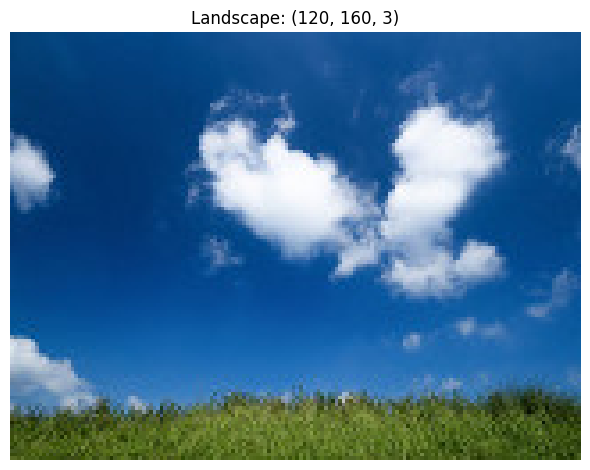

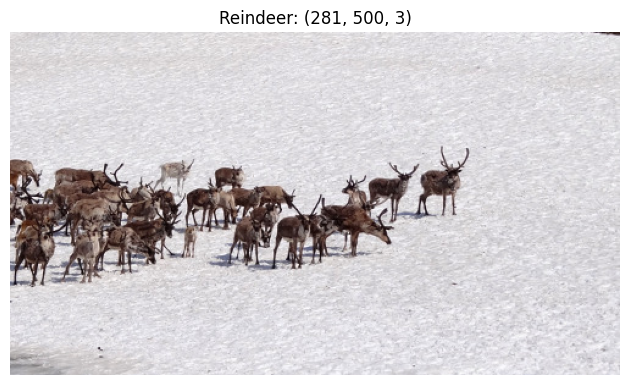

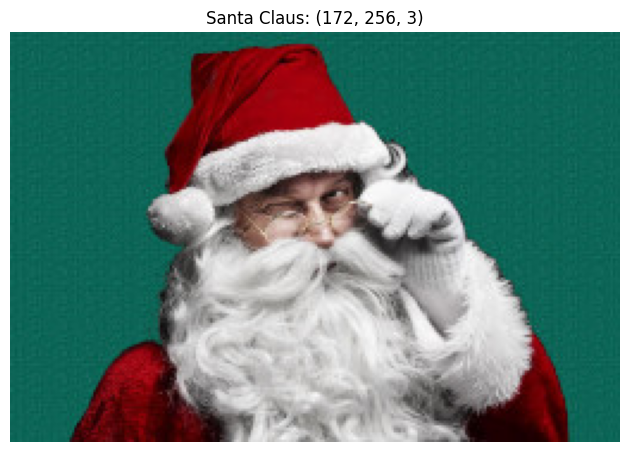

In [8]:
# To load the images use the function plt.imread(<path_to_iamge>)
landscape = plt.imread('./data/landscape.jpg')
reindeer = plt.imread('./data/reindeer.jpg')
santaclaus2 = plt.imread('./data/santaclaus2.jpg')

# Plot the images with their shapes
# Sugestion: use the function img_plot()
img_plot(landscape, 'Landscape')
img_plot(reindeer, 'Reindeer')
img_plot(santaclaus2, 'Santa Claus')

We are going to start by using the Santa Claus image.


In [9]:
# Reshape the data to a matrix of num_pixels x 3 
# (divide by 255 to have colors in [0 1] range for plotting functions of sklearn)
def img_reshape(img):
    img_new = img.reshape(-1, 3) / 255

    return img_new

santa_r = img_reshape(santaclaus2)

# Print the shape of the data and the min and max values of the pixels
print("Shape of the data:", santa_r.shape)
print("Min value of pixels:", np.min(santa_r))
print("Max value of pixels:", np.max(santa_r))

Shape of the data: (44032, 3)
Min value of pixels: 0.0
Max value of pixels: 1.0


Plot the points in the 3-dimensional space with normalized intervals between 0 and 1 (corresponding to the three channels of the image, i.e. Red Green and Blue)

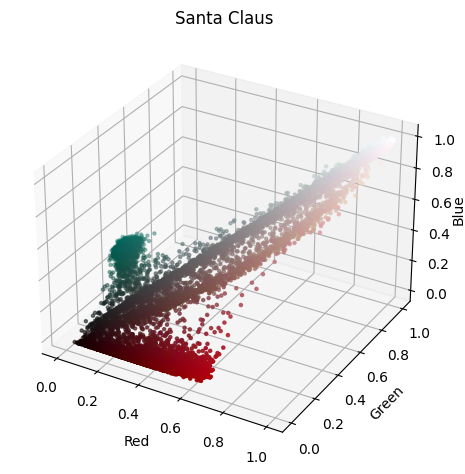

In [10]:
# Sugestion: use the function scatter_plot()
scatter_plot(santa_r, title='Santa Claus')

### TO DO (A.1)
Implement the k-means algorithm manually (**do not use the kmeans function of sklearn and do not download implementations from other web sources**). The inputs to the function is the set of vectors to be clustered and the number of clusters. The output must contain the clusters barycenters, a vector associating each data point to the corresponding cluster and the error (value of the cost function) at each iteration.
Additionally, fix a maximum number of iterations of the k-means algorithm (e.g., 50).

Be careful about the initalization, you can use some random points from the training set, or get random values but ensure they are in the proper range. Poor initalizations can lead to the failure of the algorithm (in particular check that no cluster is initialized as empty, otherwise the algorithm can not update it).

In [11]:
def my_kmeans(points: np.ndarray, k: int, max_iters: int = 50) -> tp.Tuple[np.ndarray, np.ndarray, list]:
    """
    Perform K-means clustering
    :param points: data points
    :param k: number of clusters
    :param max_iters: maximum number of iterations
    """

    # Generate random centers
    # use sigma and mean to ensure it represent the whole data
    
    # Generate random centers
    centroids = np.random.randn(k, points.shape[1]) * np.std(points, axis=0) + np.mean(points, axis=0)
    
    prev_error = 100_000
    error = [9999]

    # Iterate until the estimate of that center stays the same or max iteration are reached
    iters = 0
    while (error[iters] != prev_error) and iters < max_iters:
        # Measure the distance to every center
        distances = np.linalg.norm(points[:, np.newaxis] - centroids, axis=2)

        # Assign all training data to closest center
        clusters = np.argmin(distances, axis=1)
       
        # Calculate mean for every cluster and update the center
        for i in range(k):
            if points[clusters == i].size > 0:
                centroids[i] = np.mean(points[clusters == i], axis=0)
        
        # Update the error
        new_error = np.sum([np.linalg.norm(points[clusters == i] - centroids[i]) ** 2 for i in range(k)])
        error.append(new_error)
        
        # Update the iteration counter
        iters += 1

    return centroids, clusters, error

### TO DO (A.2)

Now try the function you developed on the Santaclaus image with three clusters (k=3). 

Then plot the data points in the 3-dimensional space, each point must be coloured based on the membership to one of the clusters. Additionally, plot the respective clusters centroids (use a different shape, size or color to highlight the centroids).

my_kmeans errors: [9999, 1338.68360451546, 1101.1566125196737, 1093.596519618878, 1092.9652005935332, 1092.8948432719292, 1092.8816528132297, 1092.8772697296356, 1092.8767238335543, 1092.876549748246, 1092.876549748246, 1092.876549748246, 1092.876549748246, 1092.876549748246, 1092.876549748246, 1092.876549748246, 1092.876549748246, 1092.876549748246, 1092.876549748246, 1092.876549748246, 1092.876549748246, 1092.876549748246, 1092.876549748246, 1092.876549748246, 1092.876549748246, 1092.876549748246, 1092.876549748246, 1092.876549748246, 1092.876549748246, 1092.876549748246, 1092.876549748246, 1092.876549748246, 1092.876549748246, 1092.876549748246, 1092.876549748246, 1092.876549748246, 1092.876549748246, 1092.876549748246, 1092.876549748246, 1092.876549748246, 1092.876549748246, 1092.876549748246, 1092.876549748246, 1092.876549748246, 1092.876549748246, 1092.876549748246, 1092.876549748246, 1092.876549748246, 1092.876549748246, 1092.876549748246, 1092.876549748246]


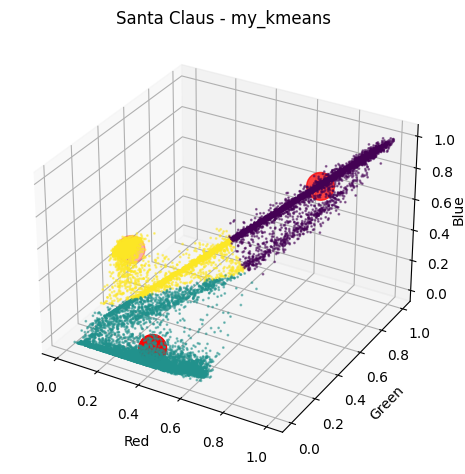

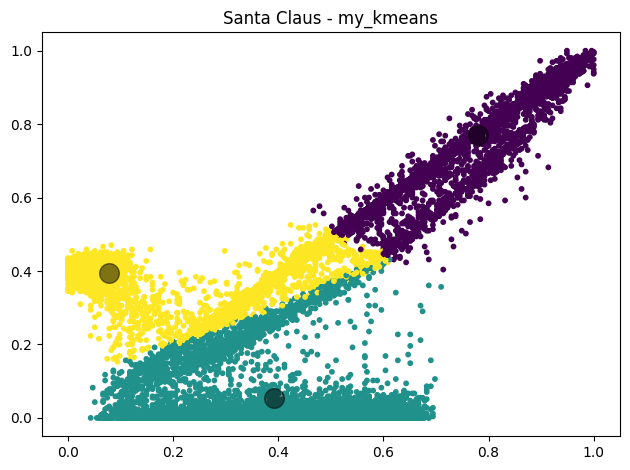

In [15]:
# Run your K-means function on the data
centroids, clusters, error = my_kmeans(santa_r, k=3)

# Print the errors:
print('my_kmeans errors:', error)


# Plot the results
# cluster_plot(clusters, santa_r, title='my_kmeans')
scatter_plot(santa_r, clusters, centroids, title='Santa Claus - my_kmeans')
scatter_plot_2d(santa_r, clusters, centroids, title='Santa Claus - my_kmeans')

### TO DO (A.3) 
Plot the value of the error versus the number of iterations

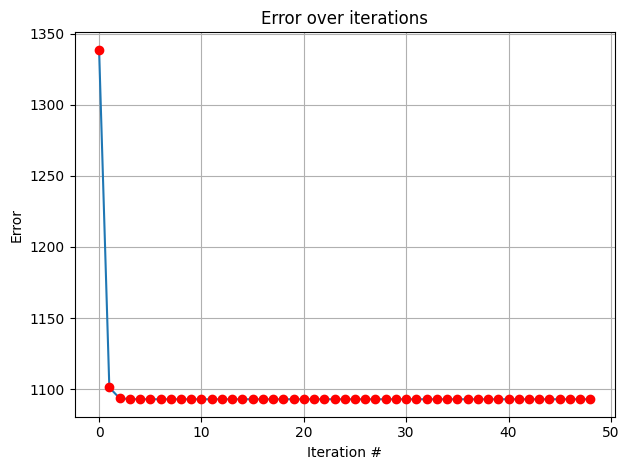

In [16]:
# Sugestion: use the function error_plot()
error_plot(error)

### TO DO (A.4)
Now use the k-means function provided in sklearn. Pass to the function the number of clusters and use multiple random initializations (n_init parameter). Go to the documentation page for further details

In [17]:
# Define the K-means model
kmeans_model = KMeans(n_clusters=3, random_state=ID, n_init=10, max_iter=50)

# Fit the model to the data
kmeans_model.fit(santa_r)

# Get the cluster centers
cluster_centers = kmeans_model.cluster_centers_
print('KMeans cluster centers:', cluster_centers)

KMeans cluster centers: [[0.07858772 0.3947123  0.34315944]
 [0.77998175 0.77044226 0.76776639]
 [0.39260245 0.05388908 0.06714015]]


Perform the same plot as above but with the output of the k-means function provided in sklearn.

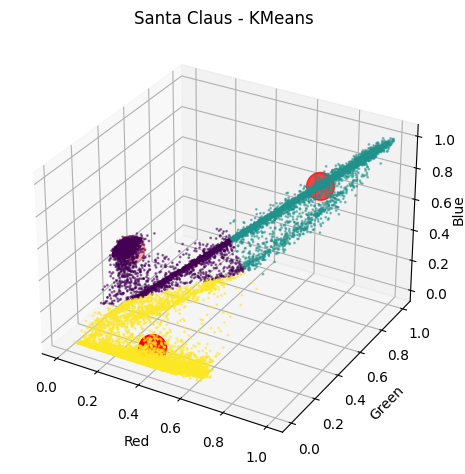

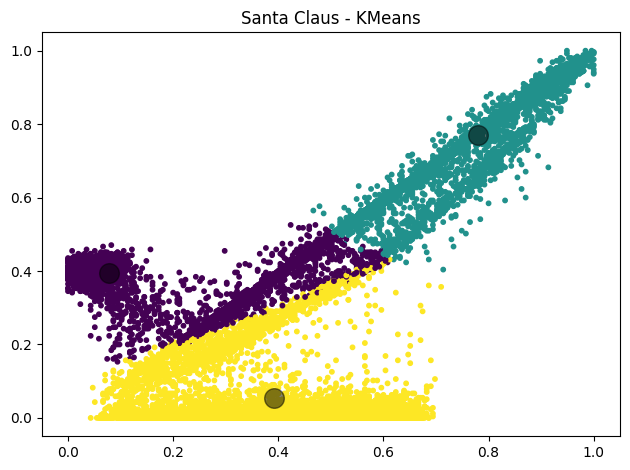

In [18]:
# Get the cluster labels
cluster_labels = kmeans_model.labels_

# cluster_plot(labels=cluster_labels, x=santa_r, title='Santa Claus - KMeans')
scatter_plot(santa_r, cluster_labels, cluster_centers, title='Santa Claus - KMeans')
scatter_plot_2d(santa_r, cluster_labels, cluster_centers, title='Santa Claus - KMeans')

### TO DO (A.Q1) [Answare the following] 

Compare the results obtained with your implementation and with k-means from sklearn. Do you observe any differences, *i.e.*, do the two plots match?

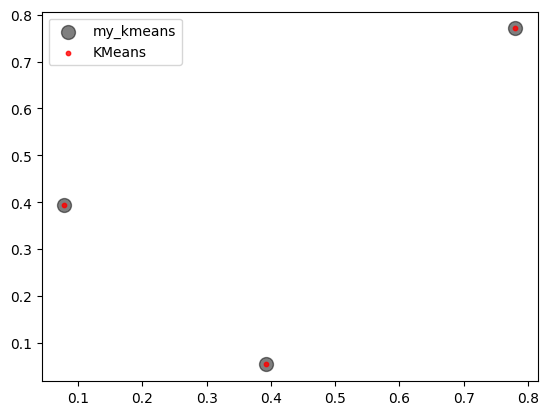

In [19]:
plt.scatter(centroids[:, 0], centroids[:, 1], c='black', s=100, alpha=0.5, label='my_kmeans')
plt.scatter(cluster_centers[:, 0], cluster_centers[:, 1], c='red', s=10, alpha=0.8, label='KMeans')
plt.legend()
plt.show()

**ANSWER A.Q1:** In `my_kmeans` there's a bit of stochasticity, due to probably either the seed and the basic implementation of the algorithm. A part from that, the clustering is ~ the same and `my_kmeans` centroids correspond to the SKlearn KMeans ones.

### TO DO (A.5)

Now display the segmented image based on the two clusters found above with the k-means functions by sklearn.

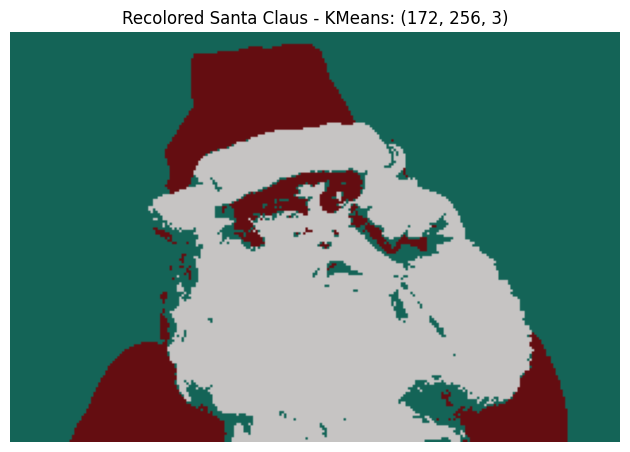

In [23]:
# Extarct the color values of the centers
new_image = cluster_centers[cluster_labels].astype(np.float64)

# Reshape the data to the original image shape
new_image = new_image.reshape(santaclaus2.shape)

# Plot the recolored image
img_plot(new_image, 'Recolored Santa Claus - KMeans')

Now display the segmented image based on the two clusters found above with the k-means functions implemented by yourselves.

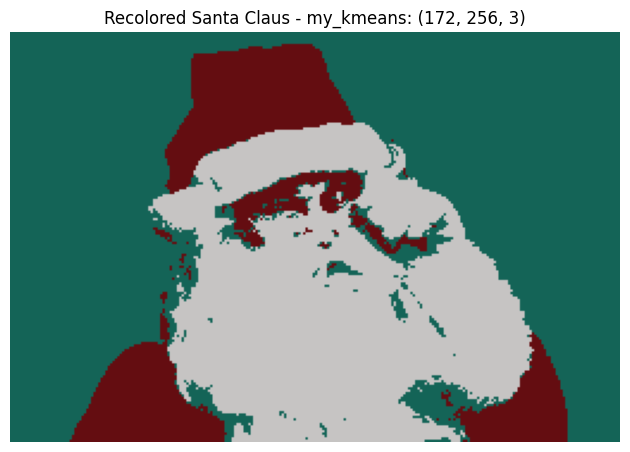

In [21]:
# Extarct the color values of the centers
new_image = centroids[clusters].astype(np.float64)

# Reshape the data to the original image shape
new_image = new_image.reshape(santaclaus2.shape)

# Plot the recolored image
img_plot(new_image, 'Recolored Santa Claus - my_kmeans')

### TO DO (A.Q2) [Answare the following]

What do you observe? Do you think clustering is useful for image segmentation? And for image compression? Comment your answer.

**ANSWER A.Q2:**  
The first thing you can observe is that when clustering the original 256 color range down to only 3 colors, you are reducing the color depth of the image. The original image is very detailed and nuanced color, while the recolored image is less detailed and it's "blocky" like a pixel art (actually, in order to create a pixel art image starting from a classical image you segment the image and group different pixel in just one. The level of detail depends on how many bits you want the image to consist of.)  

Clustering is useful for both image segmentation and image compression. In the first, clustering algorithms can be used to group similar pixels together. This can help in separating the foreground from the background or identifying objects within the image.  
In the latter, clustering can be used to reduce the number of unique colors in an image. Each cluster represents a color. This can significantly reduce the amount of data needed to store the image (i.e. compressing it). Compressing and image (or, in general, data) can lead to a loss of information and details, therefore the effectiveness of clustering for these tasks can depend on the specific requirements and constraints of the task at hand.

### TO DO (A.6)

Now load the landscape image (optional: try also with the reindeer image) and segment it using kmeans with k varying from 2 to 15 clusters. You can use the sklearn implementation.

Then plot the resulting data points in the 3-dimensional space, each point must be colored based on the cluster membership.

Shape of the data: (19200, 3)
Min value of pixels: 0.0
Max value of pixels: 1.0

K-means clustering with different values of K (2-15):


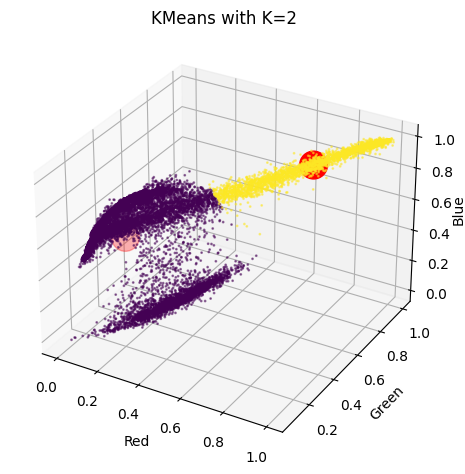

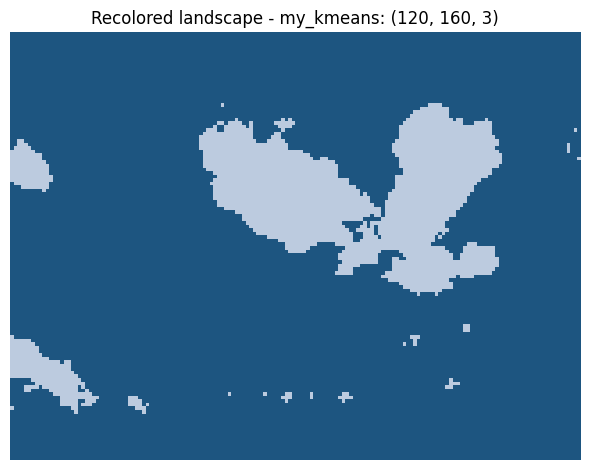

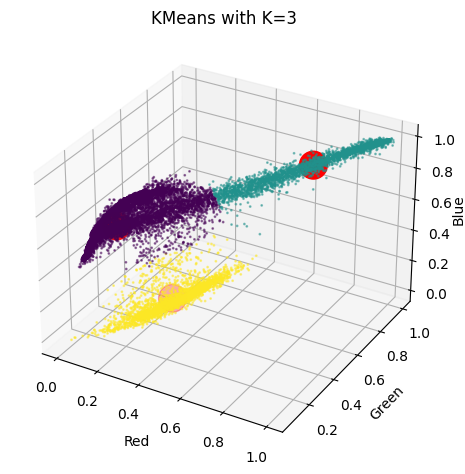

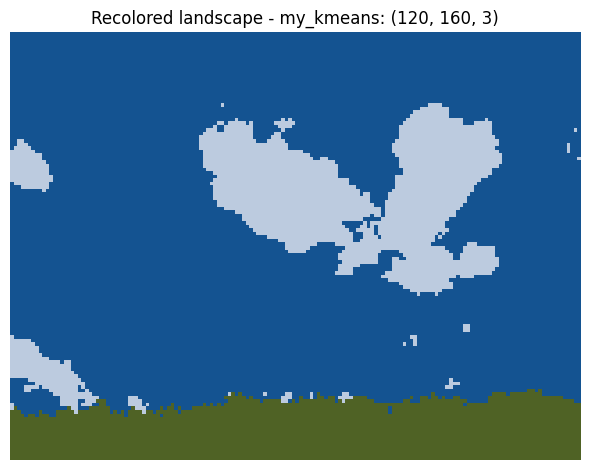

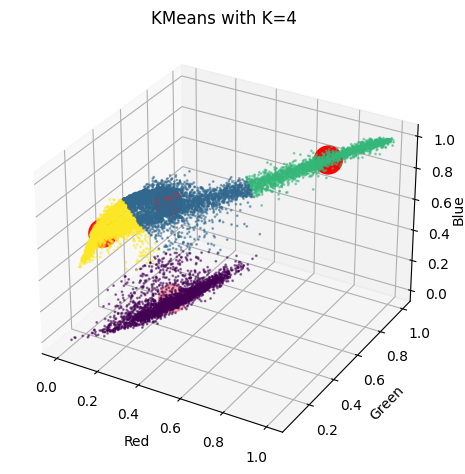

...

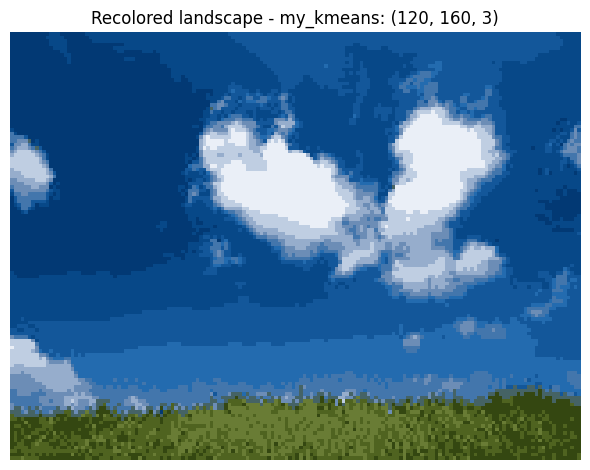

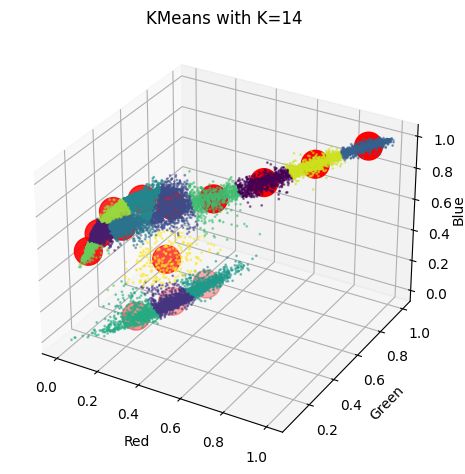

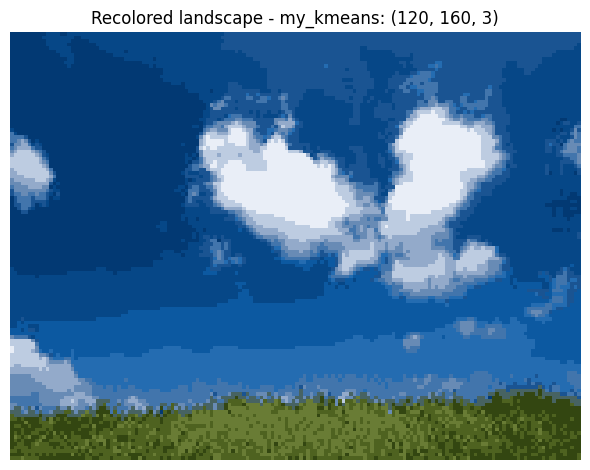

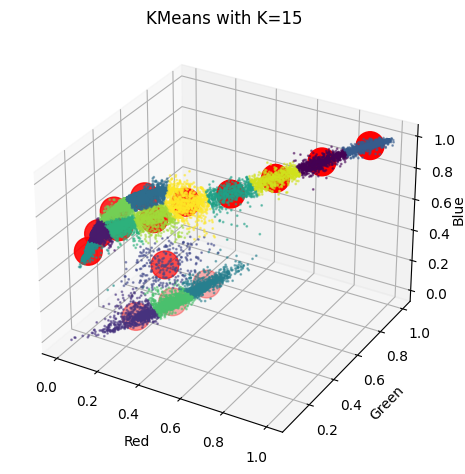

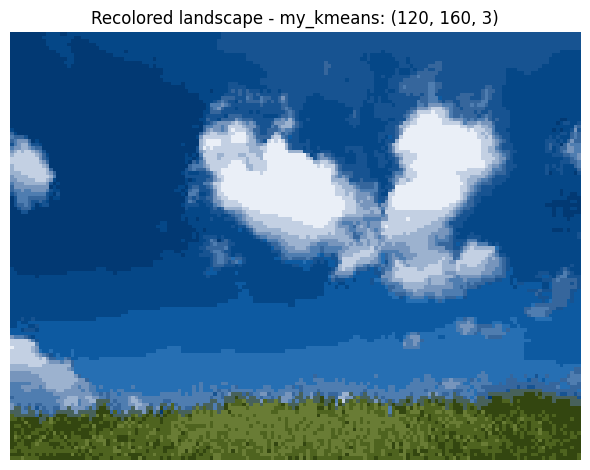

In [32]:
# Reshape the data to a matrix of total_num_pixels x 3
land_r = img_reshape(landscape)

# Print the shape of the data and the min and max values of the pixels
print("Shape of the data:", land_r.shape)
print("Min value of pixels:", np.min(land_r))
print("Max value of pixels:", np.max(land_r))

# Cycle over different values of K and plot the results for each value
print('\nK-means clustering with different values of K (2-15):')
inertia = list()
# k_list = [2, 5, 10, 15, 20, 30, 40, 50, 60, 100]
for k in range(2, 16):
    # Define the K-means model
    kmeans_model = KMeans(n_clusters=k, random_state=ID, n_init=10, max_iter=50)

    # Fit the model to the data
    kmeans_model.fit(land_r)

    # Get the cluster centers
    cluster_centers = kmeans_model.cluster_centers_
    cluster_labels = kmeans_model.labels_

    # Extarct the color values of the centers
    land_n = cluster_centers[cluster_labels].astype(np.float64)

    # Reshape the data to the original image shape
    land_n = land_n.reshape(landscape.shape)

    # Update the inertia
    inertia.append(kmeans_model.inertia_)
    
    # Plot the scatter plot and the recolored imag
    scatter_plot(land_r, cluster_labels, cluster_centers, title=f'KMeans with K={k}')
    img_plot(land_n, 'Recolored landscape - my_kmeans')

    # Plot the recolored image
    # ADD YOUR CODE HERE (remove the pass statement)
    # pass

Shape of the data: (140500, 3)
Min value of pixels: 0.0
Max value of pixels: 1.0

K-means clustering with different values of K (2-15):


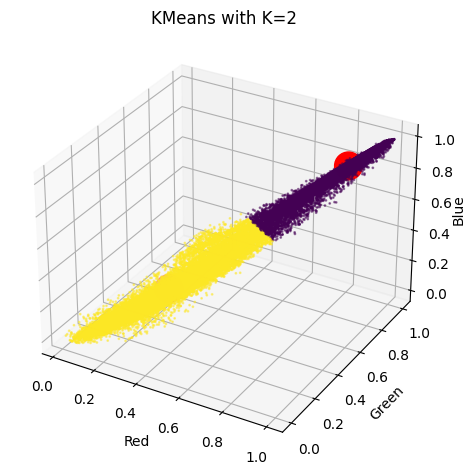

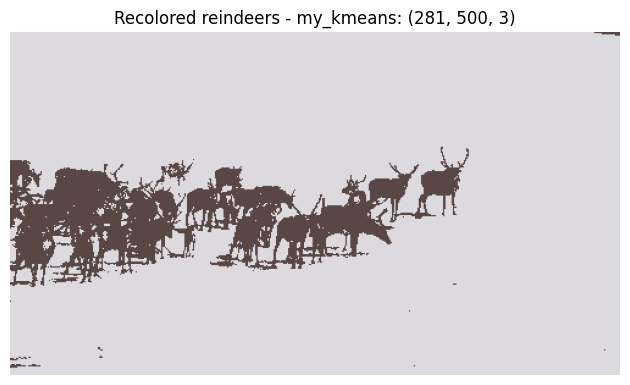

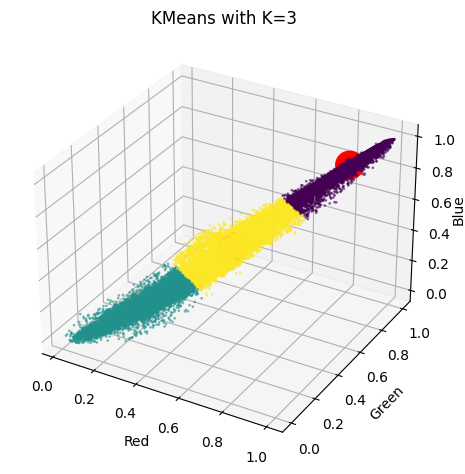

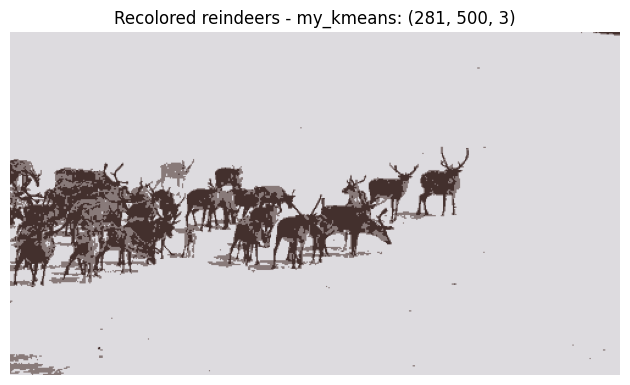

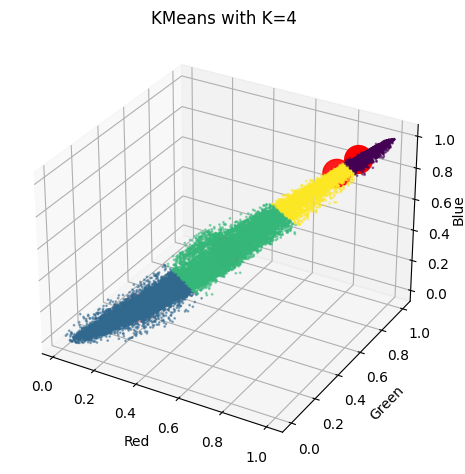

...

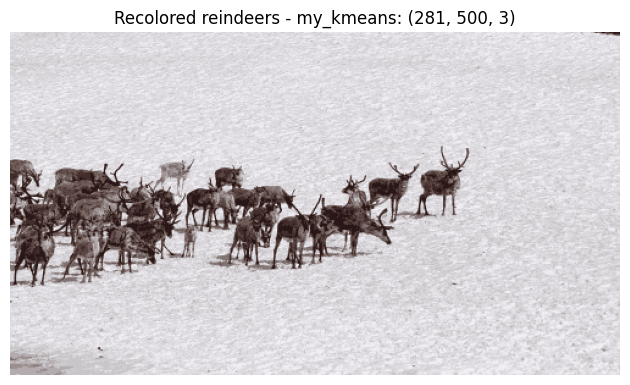

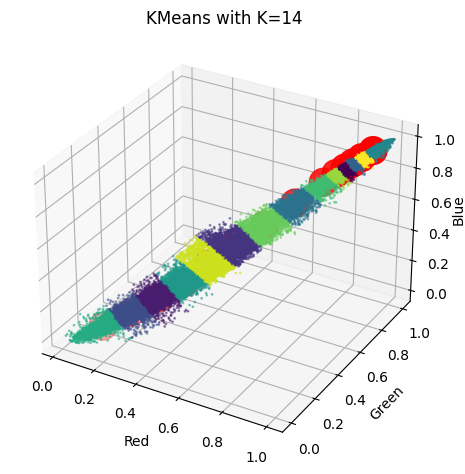

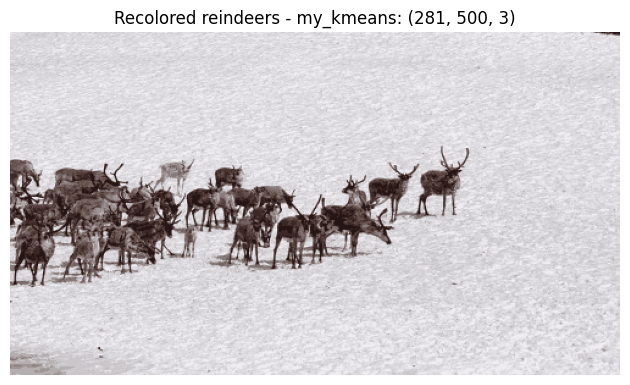

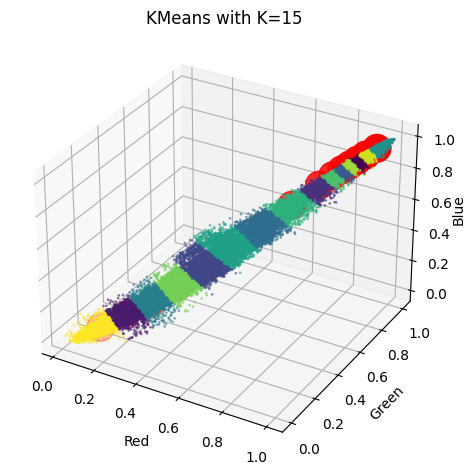

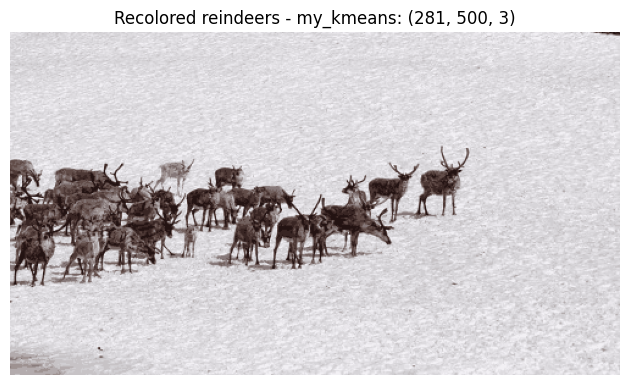

In [33]:
# Reshape the data to a matrix of total_num_pixels x 3
deer_r = img_reshape(reindeer)

# Print the shape of the data and the min and max values of the pixels
print("Shape of the data:", deer_r.shape)
print("Min value of pixels:", np.min(deer_r))
print("Max value of pixels:", np.max(deer_r))

# Cycle over different values of K and plot the results for each value
print('\nK-means clustering with different values of K (2-15):')
deer_inertia = list()
# k_list = [2, 5, 10, 15, 20, 30, 40, 50, 60, 100]
for k in range(2, 16):
    # Define the K-means model
    deer_kmeans_model = KMeans(n_clusters=k, random_state=ID, n_init=10, max_iter=50)

    # Fit the model to the data
    deer_kmeans_model.fit(deer_r)

    # Get the cluster centers
    deer_cluster_centers = deer_kmeans_model.cluster_centers_
    deer_cluster_labels = deer_kmeans_model.labels_

    # Extarct the color values of the centers
    deer_n = deer_cluster_centers[deer_cluster_labels].astype(np.float64)

    # Reshape the data to the original image shape
    deer_n = deer_n.reshape(reindeer.shape)

    # Update the inertia
    deer_inertia.append(deer_kmeans_model.inertia_)
    
    # Plot the scatter plot and the recolored imag
    scatter_plot(deer_r, deer_cluster_labels, deer_cluster_centers, title=f'KMeans with K={k}')
    img_plot(deer_n, 'Recolored reindeers - my_kmeans')

    # Plot the recolored image
    # ADD YOUR CODE HERE (remove the pass statement)
    # pass

### TO DO (A.7)

Plot for different values of k (e.g. k between 2 and 15) the respective error of the kmeans algorithm 

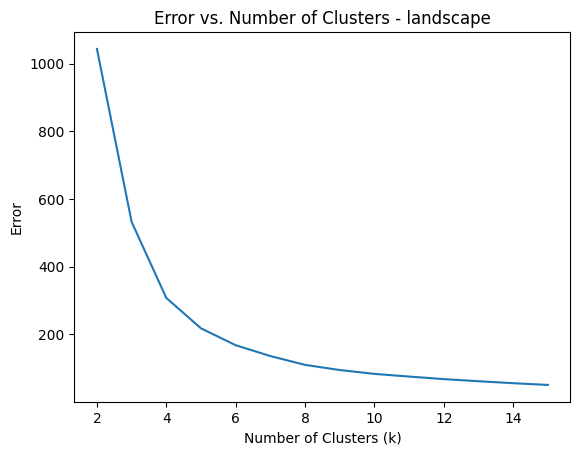

In [34]:
k_values = range(2,16)

plt.plot(k_values, inertia)

plt.xlabel('Number of Clusters (k)')
plt.ylabel('Error')
plt.title('Error vs. Number of Clusters - landscape')
plt.show()

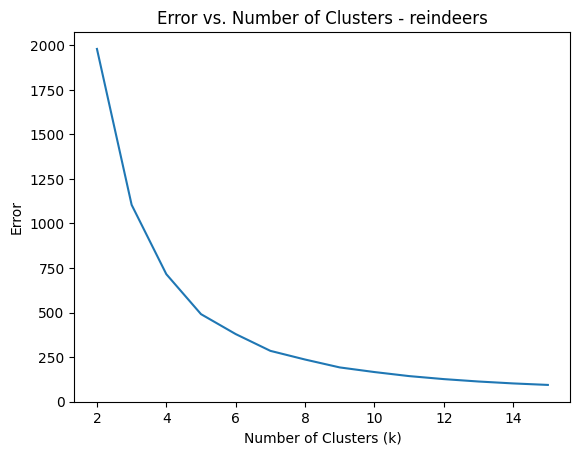

In [35]:
k_values = range(2,16)

plt.plot(k_values, deer_inertia)

plt.xlabel('Number of Clusters (k)')
plt.ylabel('Error')
plt.title('Error vs. Number of Clusters - reindeers')
plt.show()

### TO DO (AQ.3) [Answare the following]

Compare the results with different values of k, what do you observe? 

Analyze also the error, which one do you think is the optimal value of k?

Is there a single, clear answer?

**ANSWER A.Q3:** In both cases the error in the plots decreases as the number of clusters increases, but the rate of decrease slows down after about 10 clusters. This suggests that the optimal value of k is somewhere around 10 (or more), but there is no single, clear answer. The best value of k will depend on the specific dataset and the desired level of granularity in the clustering results.
Doing some test with more cluster than 16 (e.g. `k_list = [2, 5, 10, 15, 20, 30, 40, 50, 60, 100]`), you can see that around k>20 there's a plateau. Therefore I would say that, for this task, it's useless to use a k>25, but still there's no a single clear answer.

---

## B) Linkage-based clustering

The second part of the assignment concern instead linkage-based clustering. We will use the AgglomerativeClustering module of sklearn. 

### TO DO (B.0)

Load the sample dataset located at `data/moon_data.npz`

In [36]:
# Load sample data
data = np.load('./data/moon_data.npz', allow_pickle=True)

# Extract data
x = data['X']
labels_true = data['labels_true']

### TO DO (B.1)

Now exploit the AgglomerativeClustering algorithm from sklearn on the provided sample data points. Use the "single" linkage type that correspond to the minimum distance criteria seen in the lectures and 2 clusters. Notice that the "single" option has been introduced recently in sklearn, if you get an error ensure you have a recent version of the library. Plot the resulting clustering.

In [37]:
# Compute Agglomerative Clustering
# Define the Agglomerative Clustering model
agg_model = AgglomerativeClustering(n_clusters=2, linkage='single')

# Fit the model to the data
agg_model.fit(x)

# Compute the number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(agg_model.labels_)) - (1 if -1 in agg_model.labels_ else 0)

# Print the results
print('Estimated number of clusters: %d' % n_clusters_)

Estimated number of clusters: 2


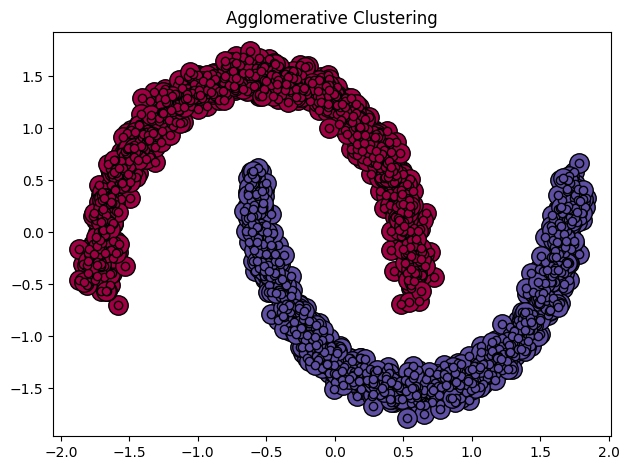

In [38]:
# Plot result 
# Sugestion: use the function cluster_plot()
cluster_plot(agg_model.labels_, x, title='Agglomerative Clustering')

### TO DO (B.2)

Now try the KMeans with two clusters on the same dataset we used for the AgglomerativeClustering algorithm.

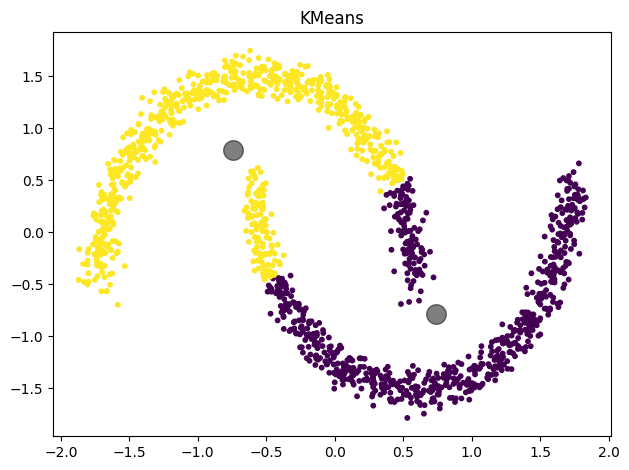

In [39]:
# Define the K-means model
kmeans_model = KMeans(n_clusters=2, random_state=ID, n_init=10, max_iter=50)

# Fit the model to the data
kmeans_model.fit(x)

# Get the cluster centers
cluster_centers = kmeans_model.cluster_centers_

# Extarct the color values of the centers
new_image = cluster_centers[kmeans_model.labels_].astype(np.float64)

# Plot the results
# Sugestion: use the function scatter_plot_2d()
scatter_plot_2d(x, kmeans_model.labels_, cluster_centers, title='KMeans')

### TO DO (B.Q1) [Answare the following]

Compare the results of K-means and Agglomerative Clustering and explain what you observe and why?

**ANSWER B.Q1:** The results are pretty different. Agglomerative Clustering (AC, for short) is able to reconstruct the distribution of the data, clearly separated in 2 distinct clusters, while K-Means (KM, for short) doesn't.  
This difference can be attributed to the way these algorithms work:  
- AC is a hierarchical clustering method that builds a hierarchy of clusters by successively merging or splitting existing clusters. It doesn't make any assumption about the shape or size of the clusters, which can make it more flexible than KM in certain situation.
- KM is a centroid-based algorithm that aims to partition the data into clusters such that the sum of the squared distances from each point to the centroid of its assigned cluster is minimized. It's sensitive to the initial placement of the centroids, which can lead to different results if the initialization is unlucky. Also, KM assumes that clusters are convex and isotropic, which is not always the case.

---